In [1]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import datasets, layers, Model, utils, optimizers

In [2]:
image_path = './Images/'
mask_path = './Masks/'

In [50]:
imgs = []
masks = []
for maskname in os.listdir(mask_path):
    mask = cv2.imread(os.path.join(mask_path,maskname), 0)
    ret, thresh = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY)
    masks.append(thresh)
    image_name = maskname.split('_mask')[0]
    img = cv2.imread(os.path.join(image_path,image_name+'.jpg'))
    imgs.append(img)

In [4]:
IMG_W = 2886
IMG_H = 2886

win_w = 481
win_h = 481

scaled_win_w = 384
scaled_win_h = 384

num_win_x = IMG_W/win_w
num_win_y = IMG_H/win_h

In [52]:
X = []
y = []

for i in range(len(imgs)):
    img = imgs[i]
    mask = masks[i]

    x_count = 0
    y_count = 0

    for i in range(num_win_y):
        for j in range(num_win_x):
            win_img = img[y_count*win_h:(y_count+1)*win_h,x_count*win_w:(x_count+1)*win_w,:]/255.0
            win_mask = mask[y_count*win_h:(y_count+1)*win_h,x_count*win_w:(x_count+1)*win_w]/255.0
            
            scaled_win_img = cv2.resize(win_img, (scaled_win_w, scaled_win_h))
            scaled_win_mask = cv2.resize(win_mask, (scaled_win_w, scaled_win_h))
            
            X.append(scaled_win_img)
            y.append(scaled_win_mask)
            y_count+=1
        x_count+=1
        y_count=0
X = np.asarray(X)
y = np.asarray(y)

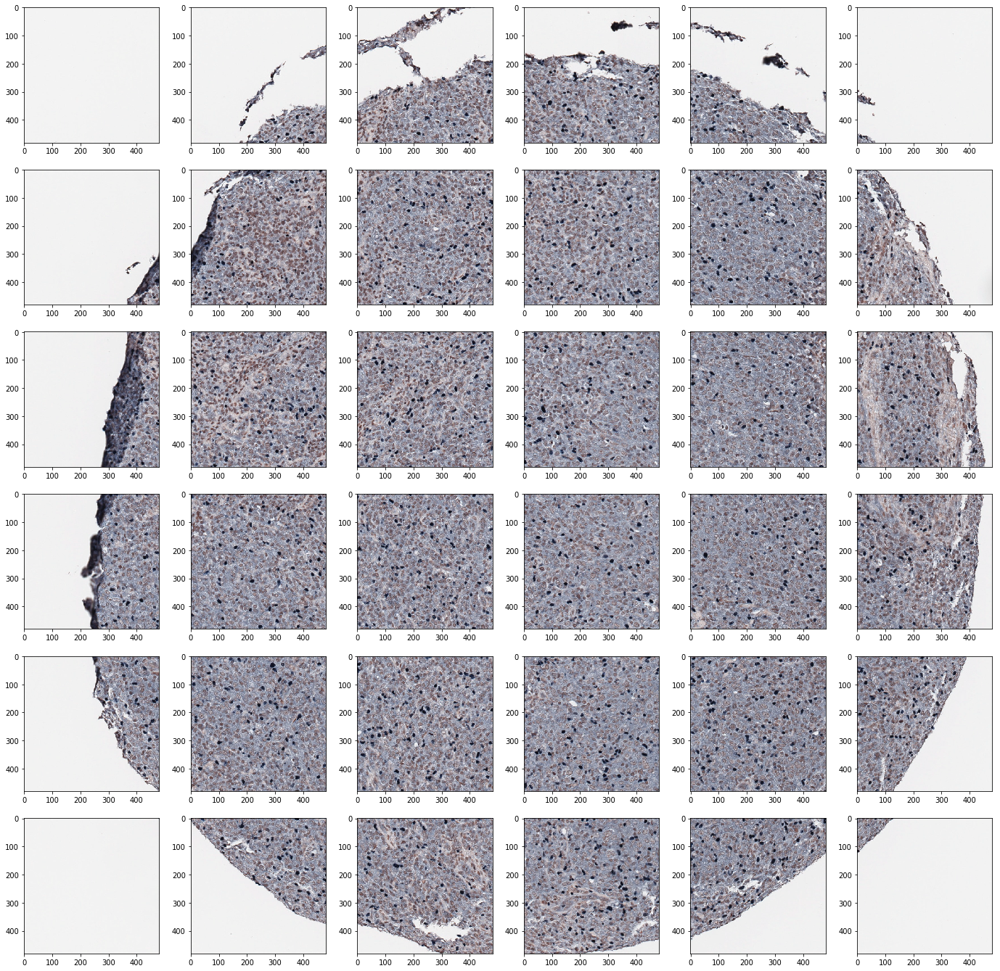

In [112]:
#Image Patches
fig,ax = plt.subplots(6,6)
fig.set_size_inches(24,24)
for i in range(len(ax)):
    for j in range(len(ax[0])):
        ax[j,i].imshow(X[(i*6)+j])

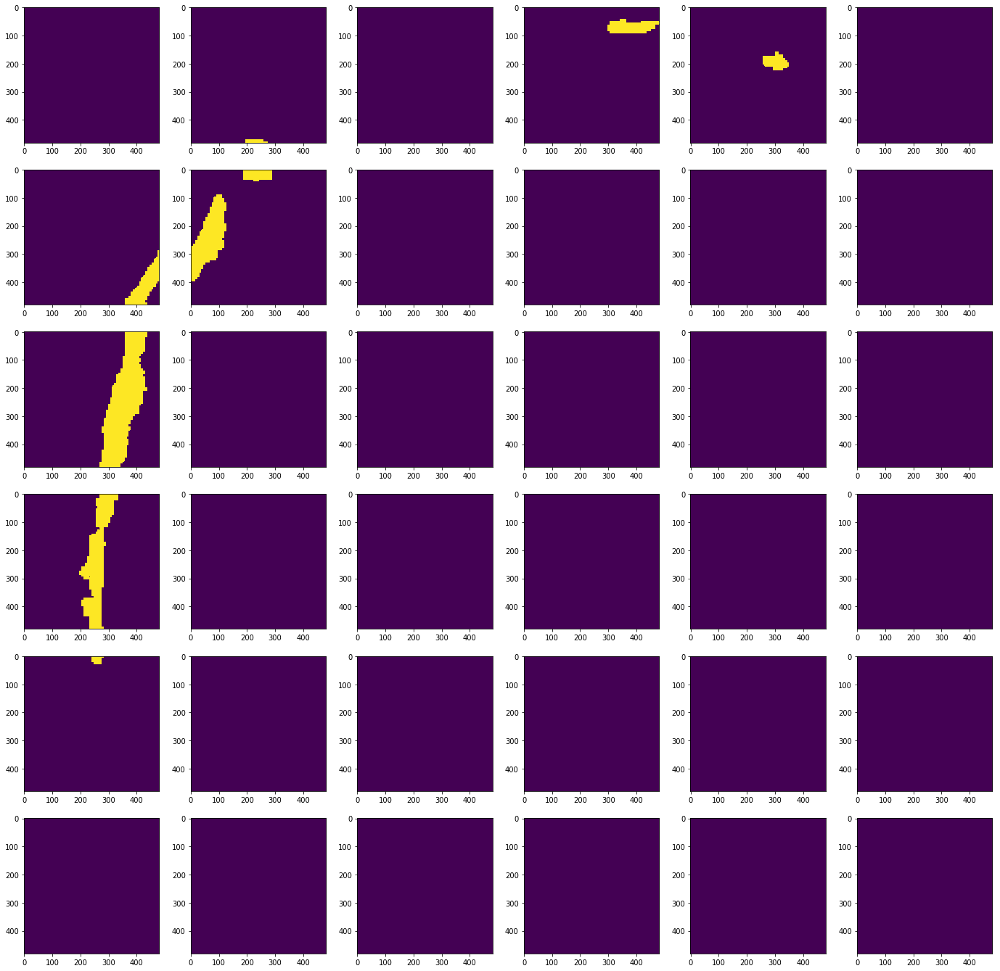

In [113]:
# Mask Patches
fig,ax = plt.subplots(6,6)
fig.set_size_inches(24,24)
for i in range(len(ax)):
    for j in range(len(ax[0])):
        ax[j,i].imshow(y[(i*6)+j])

In [7]:
#Model Definition

input_width = scaled_win_w
input_height = scaled_win_h
num_channels = 3

inputs = layers.Input((input_width, input_height, num_channels))

c1 = layers.Conv2D(16, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
c1 = layers.Dropout(0.1)(c1)
c1 = layers.Conv2D(16, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)

p1 = layers.MaxPooling2D((2,2))(c1)
c2 = layers.Conv2D(32, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = layers.Dropout(0.1)(c2)
c2 = layers.Conv2D(32, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)

p2 = layers.MaxPooling2D((2,2))(c2)
c3 = layers.Conv2D(64, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = layers.Dropout(0.2)(c3)
c3 = layers.Conv2D(64, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)

p3 = layers.MaxPooling2D((2,2))(c3)
c4 = layers.Conv2D(128, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = layers.Dropout(0.2)(c4)
c4 = layers.Conv2D(128, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)

p4 = layers.MaxPooling2D((2,2))(c4)
c5 = layers.Conv2D(256, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
c5 = layers.Dropout(0.3)(c5)
c5 = layers.Conv2D(256, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

u6 = layers.Conv2DTranspose(128, (2,2), strides=(2,2), padding='same')(c5)
u6 = layers.concatenate([u6,c4])
c6 = layers.Conv2D(128, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
c6 = layers.Dropout(0.2)(c6)
c6 = layers.Conv2D(128, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

u7 = layers.Conv2DTranspose(64, (2,2), strides=(2,2), padding='same')(c6)
u7 = layers.concatenate([u7,c3])
c7 = layers.Conv2D(64, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
c7 = layers.Dropout(0.2)(c7)
c7 = layers.Conv2D(64, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

u8 = layers.Conv2DTranspose(32, (2,2), strides=(2,2), padding='same')(c7)
u8 = layers.concatenate([u8,c2])
c8 = layers.Conv2D(32, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
c8 = layers.Dropout(0.1)(c8)
c8 = layers.Conv2D(32, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

u9 = layers.Conv2DTranspose(16, (2,2), strides=(2,2), padding='same')(c8)
u9 = layers.concatenate([u9,c1])
c9 = layers.Conv2D(16, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
c9 = layers.Dropout(0.1)(c9)
c9 = layers.Conv2D(16, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

outputs = layers.Conv2D(1,(1,1), activation='sigmoid')(c9)

model = Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 384, 384, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 384, 384, 16) 448         input_1[0][0]                    
__________________________________________________________________________________________________
dropout (Dropout)               (None, 384, 384, 16) 0           conv2d[0][0]                     
________________________________________________________________________________

In [9]:
#reshape y
if len(y.shape) < 4:
    y = np.expand_dims(y, axis=3)

#Shuffle
idx = np.random.permutation(len(X))
X = X[idx]
y = y[idx]

history = model.fit(X, y, epochs=3, batch_size=16,
                    validation_split=0.15)

Train on 397 samples, validate on 71 samples
Epoch 1/3
397/397 [==============================] - 195s 491ms/sample - loss: 0.1080 - acc: 0.9701 - val_loss: 0.0972 - val_acc: 0.9735
Epoch 2/3
397/397 [==============================] - 198s 500ms/sample - loss: 0.1006 - acc: 0.9690 - val_loss: 0.0805 - val_acc: 0.9737
Epoch 3/3
397/397 [==============================] - 198s 499ms/sample - loss: 0.1151 - acc: 0.9701 - val_loss: 0.1052 - val_acc: 0.9735


In [10]:
model.save('unet_model')

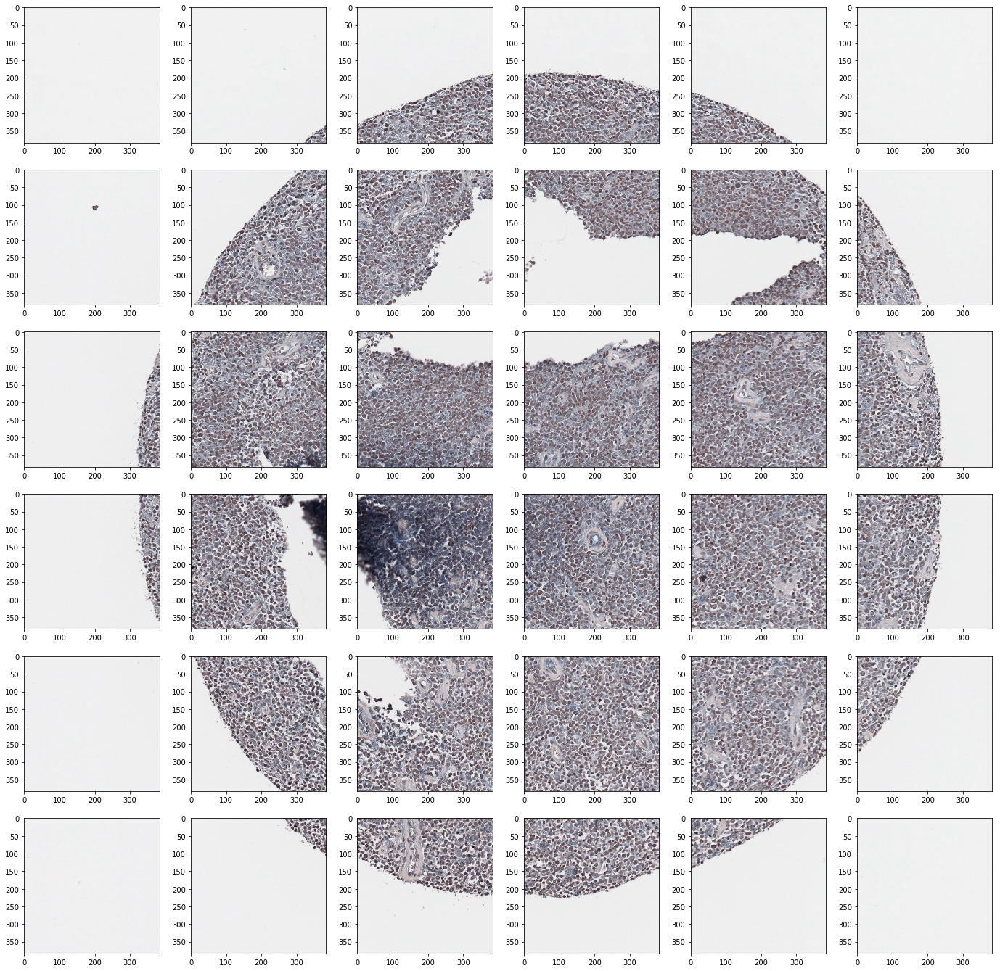

In [8]:
i=1
img = cv2.imread('./BCCA_Artifacts/tFL H_1_2_4_FOXP3.jpg')

x_count = 0
y_count = 0

X_pred = []

for i in range(num_win_y):
    for j in range(num_win_x):
        win_img = img[y_count*win_h:(y_count+1)*win_h,x_count*win_w:(x_count+1)*win_w,:]/255.0
        scaled_win_img = cv2.resize(win_img, (scaled_win_w, scaled_win_h))

        X_pred.append(scaled_win_img)
        y_count+=1
    x_count+=1
    y_count=0
X_pred = np.asarray(X_pred)

fig,ax = plt.subplots(6,6)
fig.set_size_inches(24,24)
for i in range(len(ax)):
    for j in range(len(ax[0])):
        ax[j,i].imshow(X_pred[(i*6)+j])
plt.show()

In [31]:
model = tf.keras.models.load_model('unet_model')

#y_patches = model.predict(X_pred)

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [10]:
#stride = length
mask= np.zeros((2304,2304))

x_count=0
y_count=0
for i in range(num_win_y):
    for j in range(num_win_x):
        mask[y_count*scaled_win_h:(y_count+1)*scaled_win_h,x_count*scaled_win_w:(x_count+1)*scaled_win_w] = np.reshape(y_patches[(i*6)+j], (384,384))
        y_count+=1
    x_count+=1
    y_count=0

#fixed img
mask_o = mask.copy()*255

img_out = cv2.resize(cv2.cvtColor(img.copy(), cv2.COLOR_BGR2GRAY),(2304,2304))
img_out=img_out - mask_o


## Padding

In [148]:
im_path = './BCCA_Artifacts/'
model = tf.keras.models.load_model('unet_model')    
for im_name in os.listdir(im_path):
    
    img = cv2.imread(os.path.join(im_path, im_name))

    x_count = 0
    y_count = 0

    X_pred = []

    pad = 1

    IMG_W = 2886
    IMG_H = 2886

    win_w = 481
    win_h = 481

    scaled_win_w = 384-2*pad
    scaled_win_h = 384-2*pad

    num_win_x = IMG_W/win_w
    num_win_y = IMG_H/win_h

    cols = np.arange(0, num_win_x*win_w, win_w)
    rows = np.arange(0, num_win_y*win_h, win_h)
    for row in rows:
        for col in cols:
            win_img = img[col:col+win_w,row:row+win_w,:]/255.0
            scaled_win_img = cv2.resize(win_img, (scaled_win_w, scaled_win_h))
            scaled_win_img = cv2.copyMakeBorder( scaled_win_img, pad, pad, pad, pad, cv2.BORDER_REPLICATE)
            X_pred.append(scaled_win_img)

    X_pred = np.asarray(X_pred)

    # fig,ax = plt.subplots(len(cols),len(rows))
    # fig.set_size_inches(24,24)
    # for i in range(len(ax)):
    #     for j in range(len(ax[0])):
    #         ax[j,i].imshow(X_pred[(i*len(cols))+j])
    # plt.show()

    y_patches = model.predict(X_pred)

    #stride = 1/2 length
    mask = np.zeros((382*6, 382*6))
    cols = np.arange(0, num_win_x*scaled_win_w, scaled_win_w)
    rows = np.arange(0, num_win_y*scaled_win_h, scaled_win_h)
    for i in range(len(rows)):
        for j in range(len(cols)):
            patch = y_patches[(i*6)+j][pad:-pad,pad:-pad] #remove padding
            #scaled_patch = cv2.resize(patch, (win_w, win_h)) #scale back up to size
            scaled_patch = np.reshape(patch, (382, 382)) #remove last dimension

            mask[cols[j]:cols[j]+scaled_win_h,rows[i]:rows[i]+scaled_win_w] = scaled_patch
    
    int_mask = np.uint8(mask*255)
    int_mask = cv2.resize(int_mask, (IMG_W, IMG_H))
    ret, thresh = cv2.threshold(int_mask, 0.3*np.max(int_mask), 255, cv2.THRESH_BINARY)
    dst = cv2.fastNlMeansDenoising(thresh, None, 21, 7, 10)
    img_out = img.copy()
    idx = np.where(dst == 255)
    img_out[idx] = np.asarray([255,255,255])
    cv2.imwrite('artifactless_{}.jpg'.format(im_name.split('.')[0]), img_out)

In [5]:
model = tf.keras.models.load_model('unet_model')
y_patches = model.predict(X_pred)

#stride = 1/2 length
mask = np.zeros((382*6, 382*6))
cols = np.arange(0, num_win_x*scaled_win_w, scaled_win_w)
rows = np.arange(0, num_win_y*scaled_win_h, scaled_win_h)
for i in range(len(rows)):
    for j in range(len(cols)):
        patch = y_patches[(i*6)+j][pad:-pad,pad:-pad] #remove padding
        #scaled_patch = cv2.resize(patch, (win_w, win_h)) #scale back up to size
        scaled_patch = np.reshape(patch, (382, 382)) #remove last dimension

        mask[cols[j]:cols[j]+scaled_win_h,rows[i]:rows[i]+scaled_win_w] = scaled_patch
#fixed img
mask_o = mask.copy()*255

#img_out = cv2.resize(cv2.cvtColor(img.copy(), cv2.COLOR_BGR2GRAY),(2304,2304))
#img_out=img_out - mask_o

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


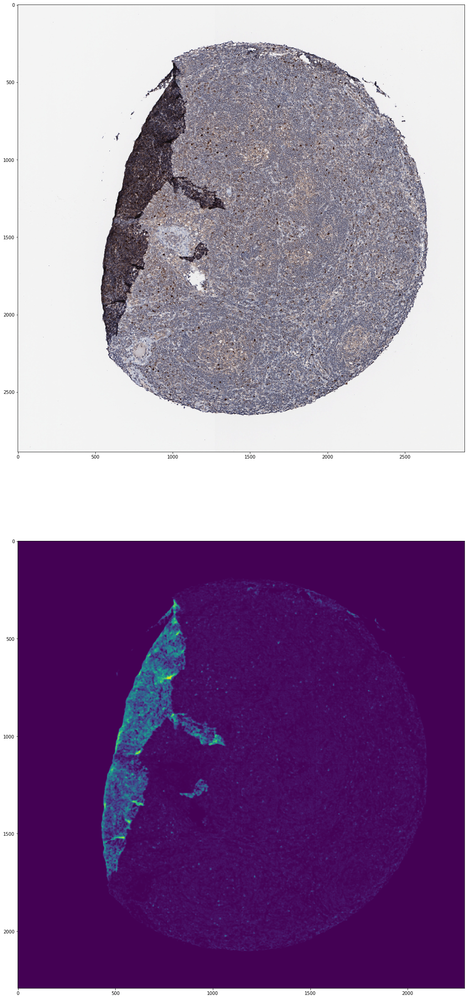

In [5]:
fig,ax = plt.subplots(2)
fig.set_facecolor('w')
fig.set_size_inches(21,40)

ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax[1].imshow(mask)
#ax[2].imshow(img_out)
#plt.savefig('predict_{}.png'.format(i))
plt.show()


## Thresholding

In [108]:
def get_bin_thresh_comp(name, mask):
    max_mask = np.max(mask)

    thresh = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35]

    plt.figure(figsize=(24,10), facecolor='w')
    grid = plt.GridSpec(2,5, wspace=0.1, hspace=0)
    for i in range(2):
        for j in range(3):
            plt.subplot(grid[i,j+2])
            ret, bin_thresh = cv2.threshold(mask, thresh[3*i+j]*max_mask, 255, cv2.THRESH_BINARY)
            plt.imshow(bin_thresh)
            plt.title('Thresh at %i%% of Max Value'% (thresh[3*i+j]*100), fontsize=16)
            plt.xticks([])
            plt.yticks([])
            #ax[i,0].imshow(mask)
    plt.subplot(grid[0:2,0:2])
    plt.imshow(mask)
    plt.title('Predicted Artifact Mask', fontsize=16)
    plt.xticks([])
    plt.yticks([])
    plt.savefig('BinaryThresh_Comp_{}.png'.format(name))

## Contours

In [139]:
a = mask.copy()*255
#a = np.expand_dims(mask, axis=2)*255
a = np.uint8(a)
ret, thresh = cv2.threshold(a, 0.3*np.max(a), 255, cv2.THRESH_BINARY)
dst = cv2.fastNlMeansDenoising(thresh, None, 21, 7, 10)

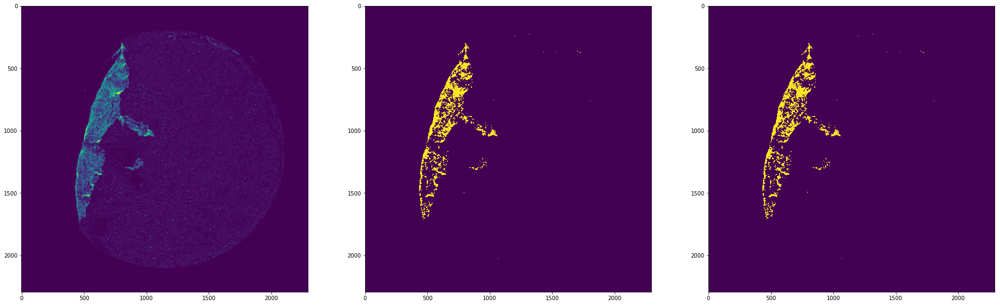

In [140]:
fig, ax = plt.subplots(1,3)
fig.set_size_inches(32,12)
ax[0].imshow(mask)
ax[1].imshow(thresh)
ax[2].imshow(dst)

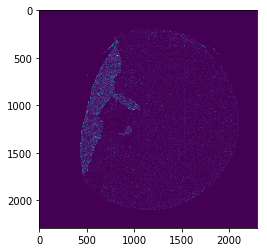

In [136]:
morph = a.copy()

kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 1))
morph = cv2.morphologyEx(morph, cv2.MORPH_CLOSE, kernel)
morph = cv2.morphologyEx(morph, cv2.MORPH_OPEN, kernel)

kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))

# take morphological gradient
gradient_image = cv2.morphologyEx(morph, cv2.MORPH_GRADIENT, kernel)

plt.imshow(gradient_image)

## KMeans

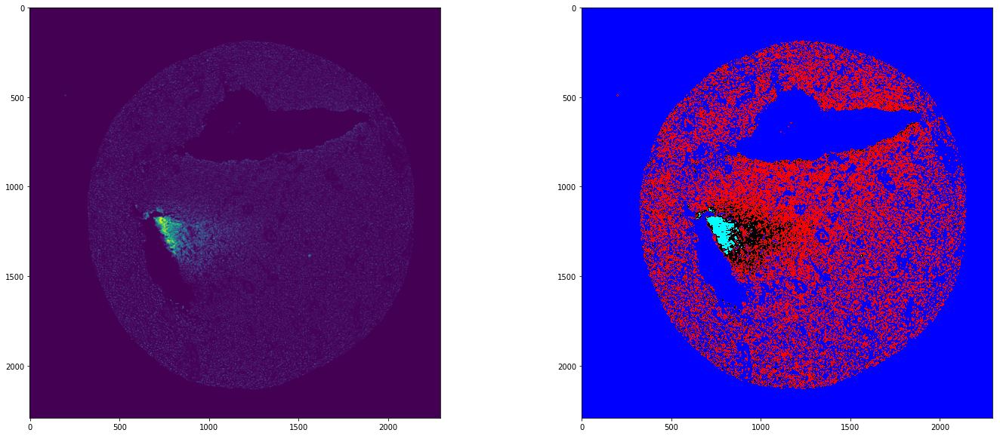

In [25]:
from sklearn.cluster import KMeans
km_in = np.expand_dims(mask, axis=2)
km_in = mask.reshape(mask.shape[0]*mask.shape[1],1)

km = KMeans(n_clusters=4, random_state=0).fit(km_in)
im_km = km.cluster_centers_[km.labels_]

#im_show = im_km.reshape(image.shape[0], image.shape[1], image.shape[2])
#im_show = im_show.astype(int) #kmeans outputs floats
im_show = np.zeros((mask.shape[0], mask.shape[1],3))
km_masks =  [np.zeros([mask.shape[0],mask.shape[1]]) for i in range(4)]

labels = km.labels_.reshape(mask.shape[0], mask.shape[1])

colors = np.asarray([[0,0,255.0],[0,255.0/2,255.0],[255.0,0,0],[255.0,255.0,255.0]])
for k in range(4):
    ind = np.where(labels == k+1)
    
    im_show[ind] = colors[k]
    km_masks[k][ind]=1

#cv2.imwrite(file_name.split('.')[0]+'_clusters.jpg', im_show)
fig,ax = plt.subplots(1,2)
fig.set_size_inches(24,10)
ax[0].imshow(mask)
ax[1].imshow(im_show)
plt.show()


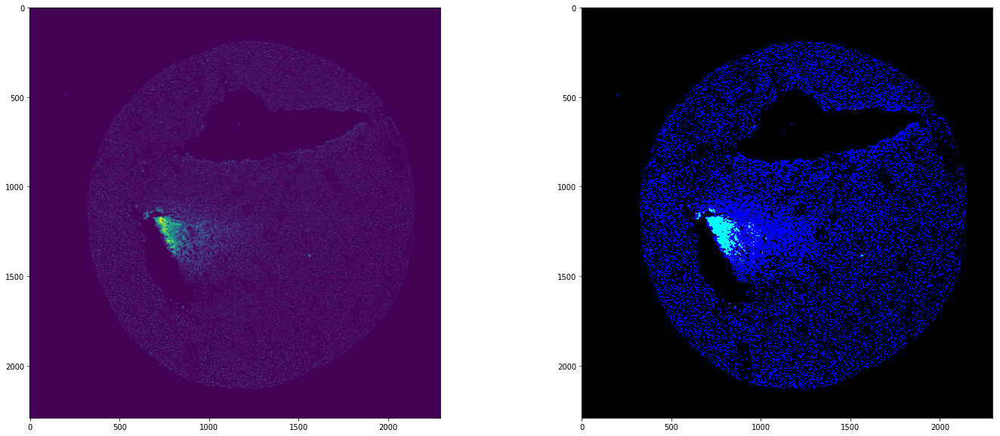

In [23]:
fig,ax = plt.subplots(1,2)
fig.set_size_inches(24,10)
ax[0].imshow(mask)
ax[1].imshow(im_show)
plt.show()

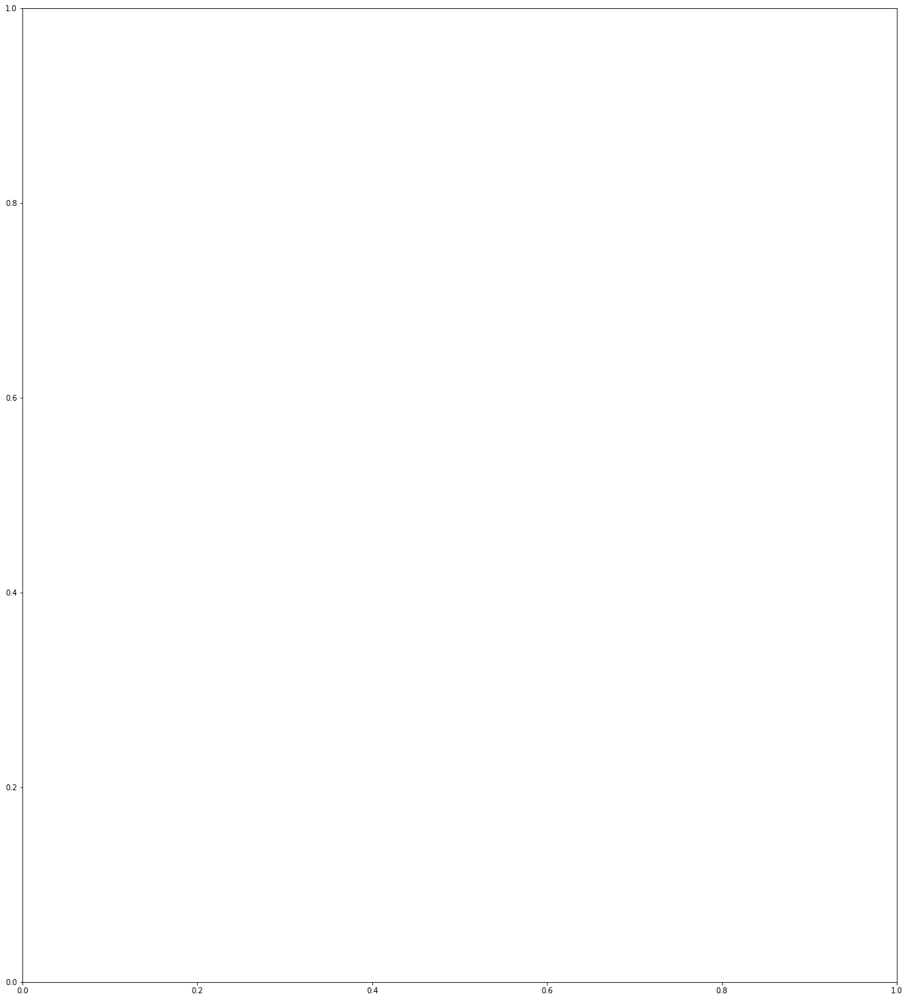

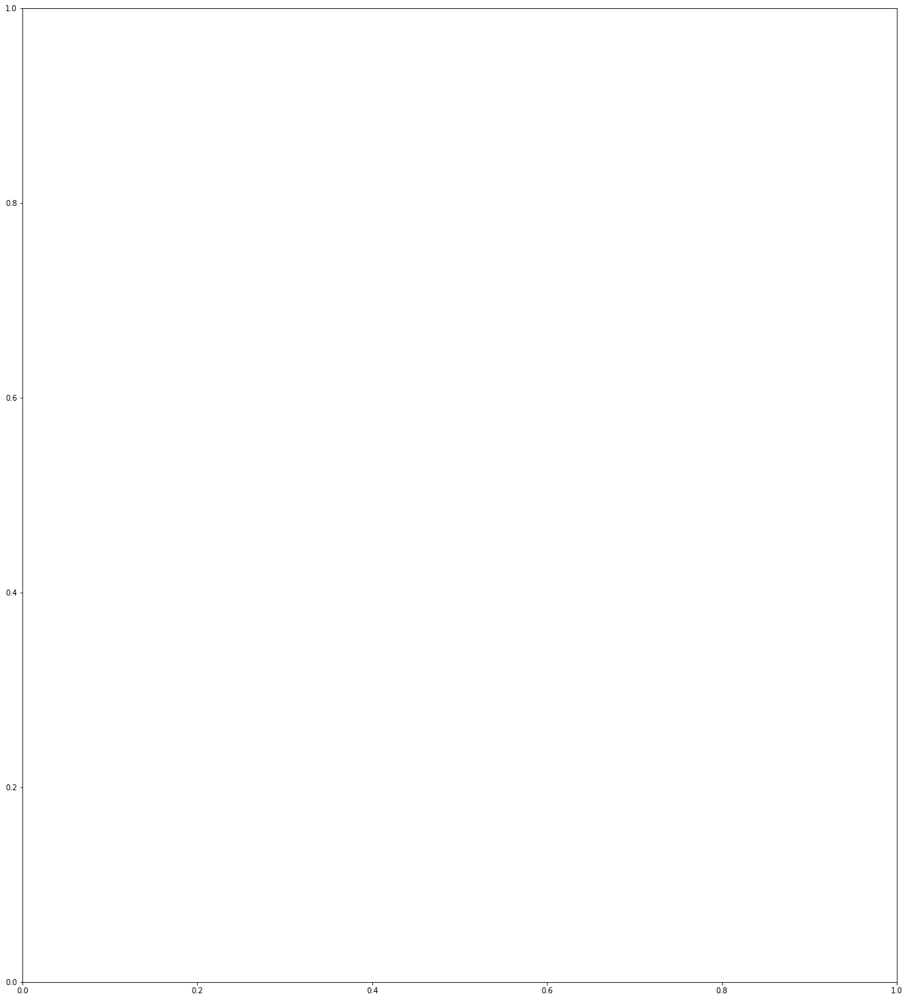

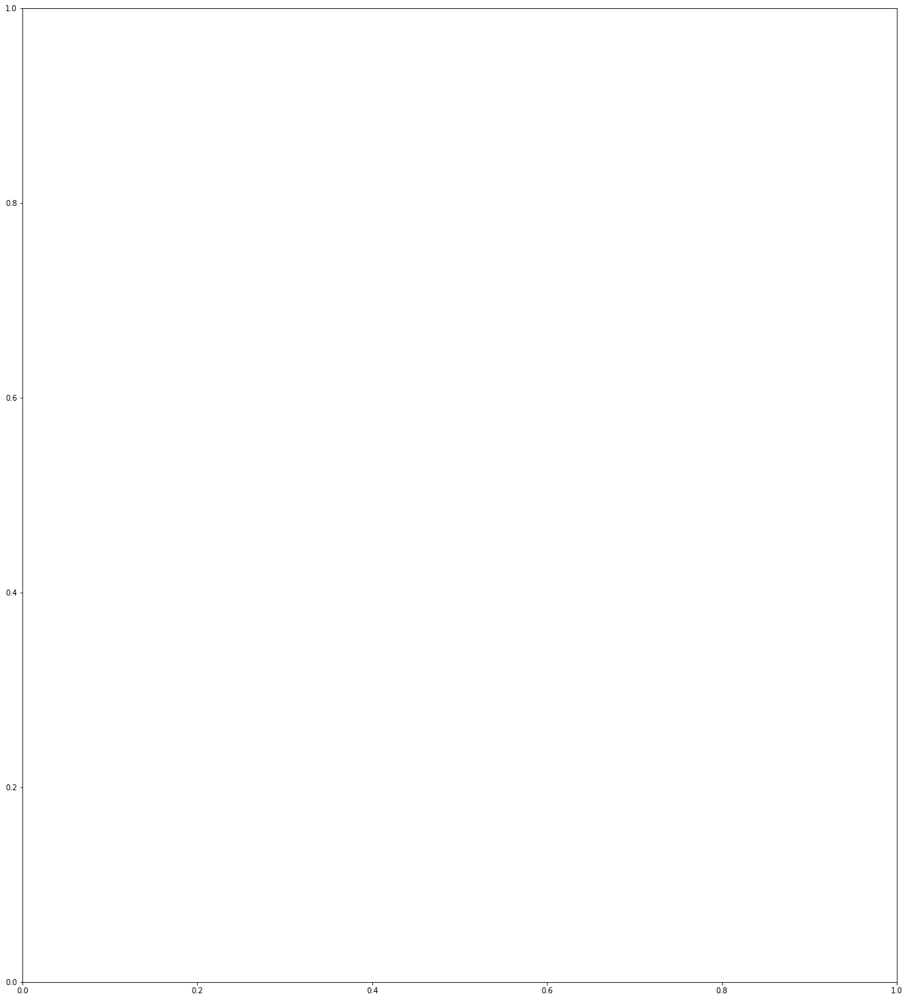

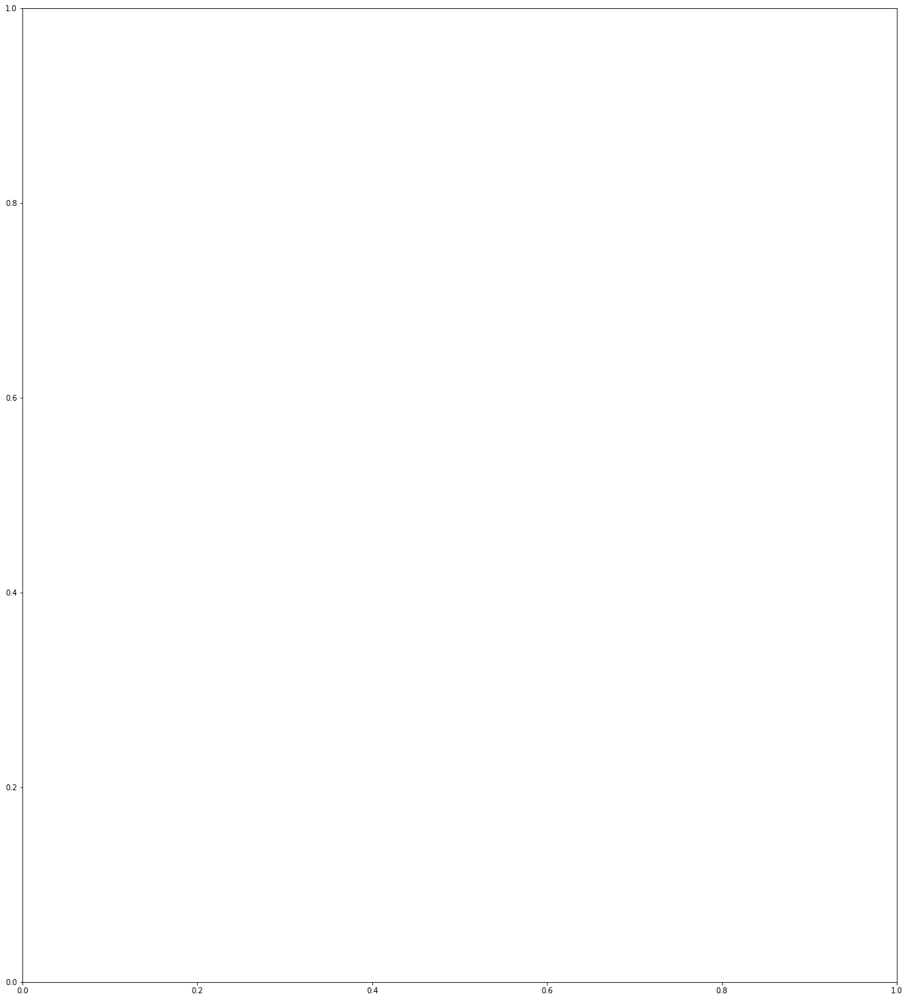

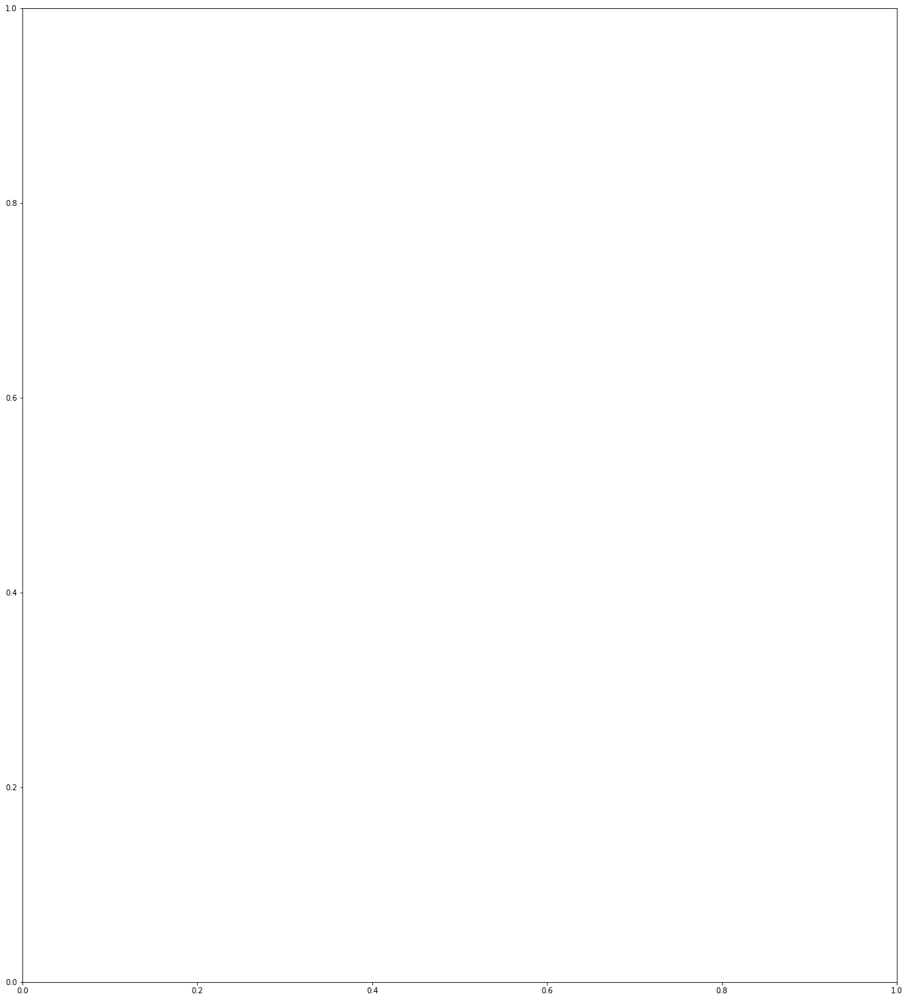

...

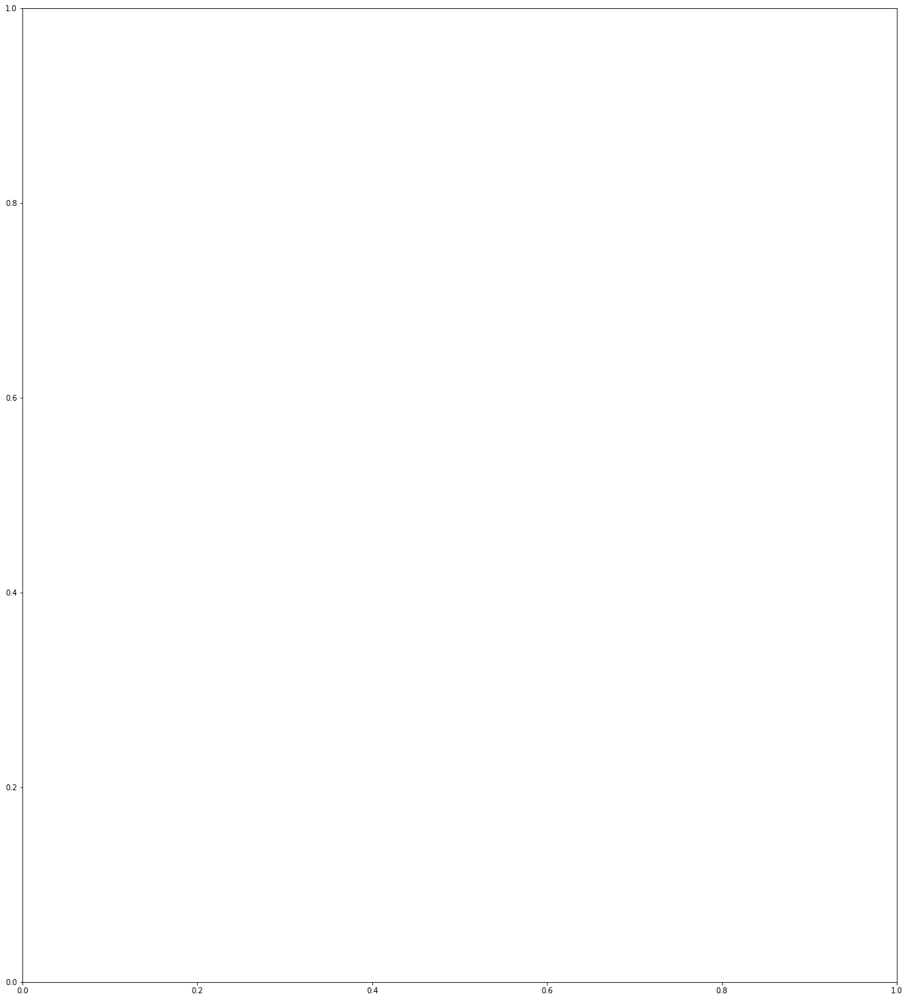

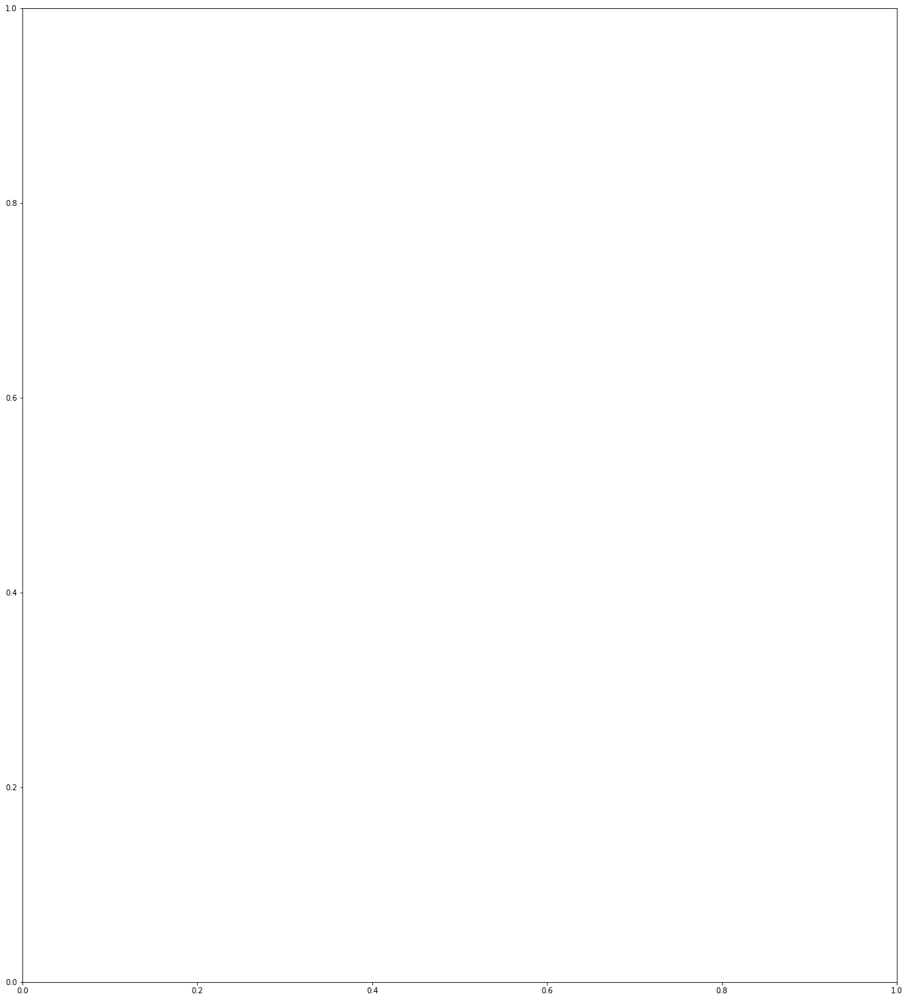

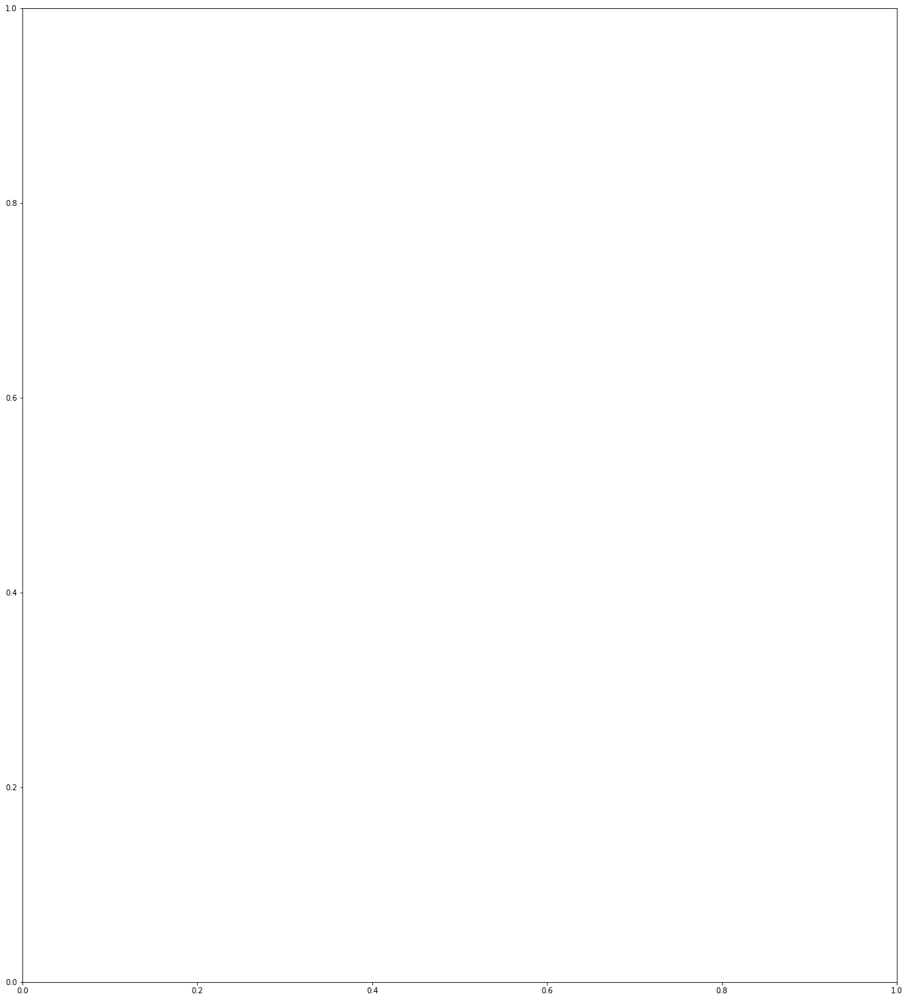

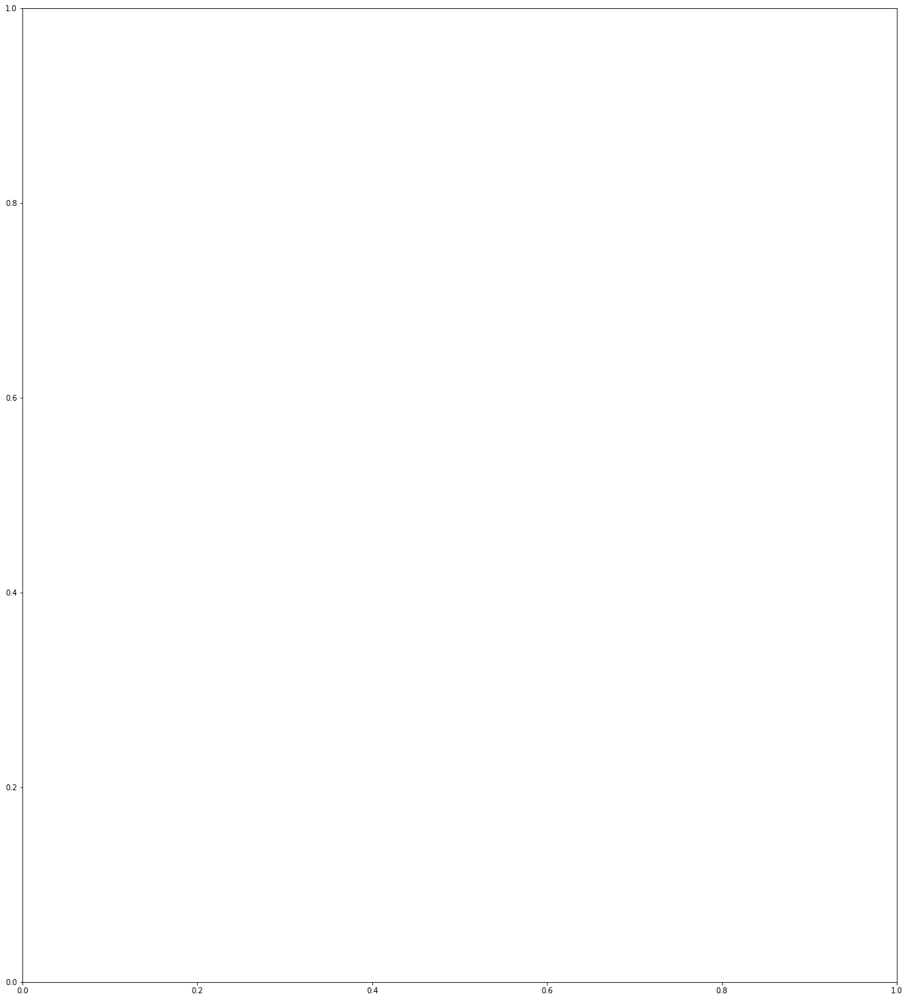

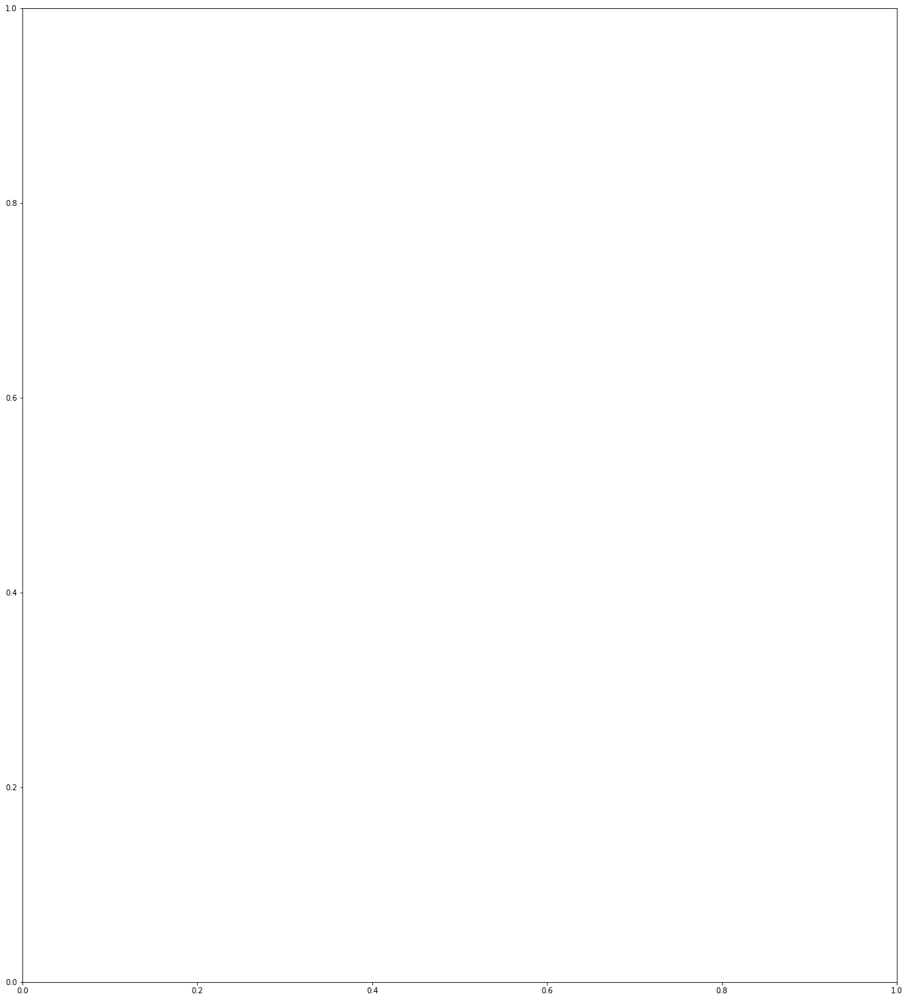

In [50]:
for idx in range(len(imgs)):
    img = imgs[idx]

    x_count = 0
    y_count = 0

    X_pred = []

    for i in range(num_win_y):
        for j in range(num_win_x):
            win_img = img[y_count*win_h:(y_count+1)*win_h,x_count*win_w:(x_count+1)*win_w,:]/255.0
            scaled_win_img = cv2.resize(win_img, (scaled_win_w, scaled_win_h))

            X_pred.append(scaled_win_img)
            y_count+=1
        x_count+=1
        y_count=0
    X_pred = np.asarray(X_pred)
    y_patches = model.predict(X_pred)
    
    mask= np.zeros((2304,2304))
    x_count=0
    y_count=0
    
    for i in range(num_win_y):
        for j in range(num_win_x):
            mask[y_count*scaled_win_h:(y_count+1)*scaled_win_h,x_count*scaled_win_w:(x_count+1)*scaled_win_w] = np.reshape(y_patches[(i*6)+j], (384,384))
            y_count+=1
        x_count+=1
        y_count=0
    fig,ax = plt.subplots(2)
    fig.set_facecolor('w')
    fig.set_size_inches(21,24)

    ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax[0].set_title('Input Image')
    ax[1].imshow(mask)
    ax[1].set_title('Predicted Artifact Mask')
    plt.savefig('predict_{}.png'.format(idx))
    plt.clf()
    plt.cla()

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


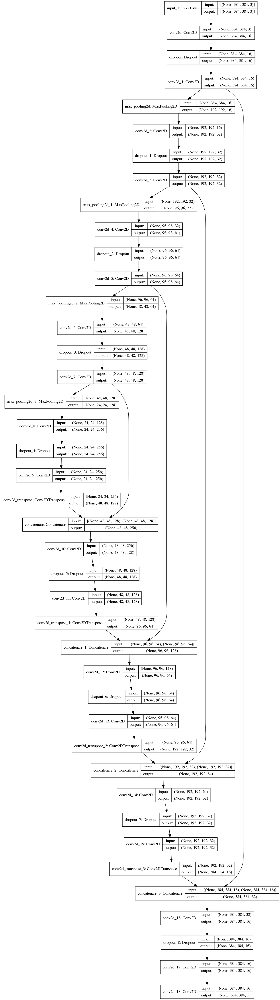

In [3]:
model = tf.keras.models.load_model('unet_model')

from tensorflow.keras.utils import plot_model
plot_model(model, to_file='model.png', show_shapes=True)

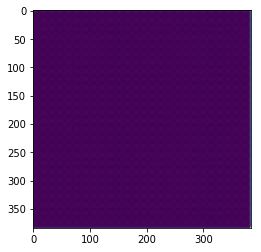

In [21]:
plt.imshow(np.reshape(y_patches[4],(384,384)))

In [27]:
y_patches[4,383,:,:]

array([[0.08537596],
       [0.03675726],
       [0.02376997],
       [0.02350733],
       [0.02601007],
       [0.02245629],
       [0.02301109],
       [0.02653372],
       [0.02389148],
       [0.0241501 ],
       [0.02367663],
       [0.02569941],
       [0.02397141],
       [0.02456892],
       [0.02361551],
       [0.02551472],
       [0.02406752],
       [0.02450892],
       [0.02357784],
       [0.02550703],
       [0.02403197],
       [0.02456084],
       [0.02355421],
       [0.02547511],
       [0.02403516],
       [0.02450585],
       [0.02357253],
       [0.02555144],
       [0.02404538],
       [0.02456647],
       [0.02358446],
       [0.02549386],
       [0.02406362],
       [0.02451983],
       [0.02358568],
       [0.02554825],
       [0.02403706],
       [0.02457142],
       [0.02357677],
       [0.02549052],
       [0.0240615 ],
       [0.02451891],
       [0.02357802],
       [0.02555653],
       [0.02404678],
       [0.02456927],
       [0.0235838 ],
       [0.025

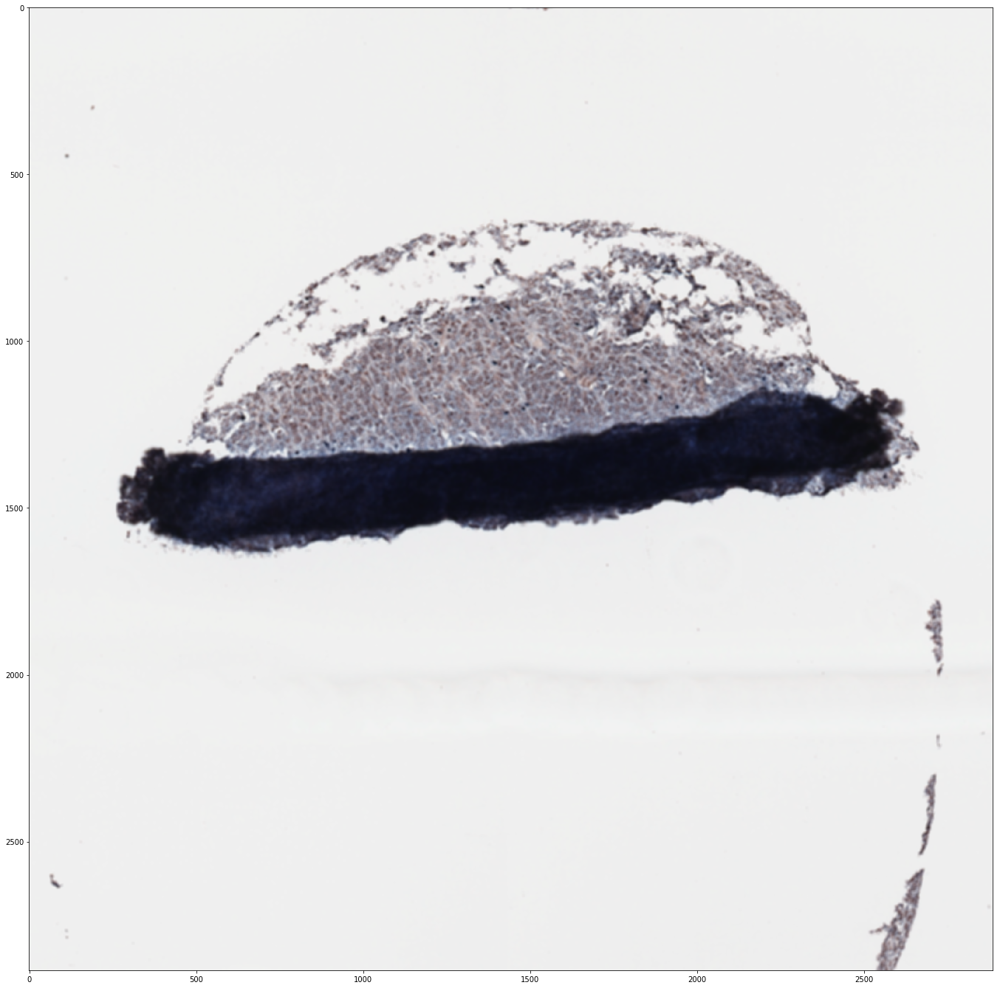

In [38]:
fig,ax = plt.subplots()
fig.set_size_inches(24,24)
ax.imshow(cv2.GaussianBlur(img, (11,11), 5))

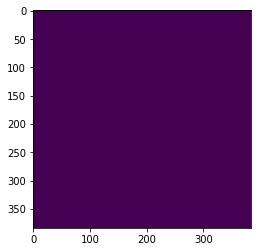

In [53]:
plt.imshow(y[0])

In [85]:
m = np.zeros(mask.shape)
m[np.where(mask>=0.3)]=1

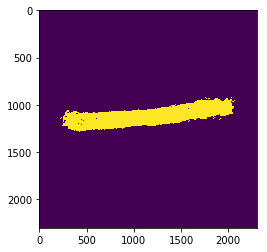

In [86]:
plt.imshow(m)

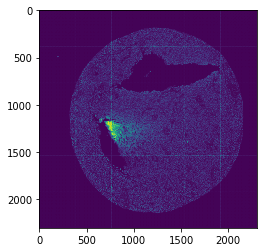

In [110]:
plt.imshow(mask_o.astype(int))

In [1]:
mask_o

NameError: name 'mask_o' is not defined

In [3]:
import os

In [12]:
os.curdir

'.'

In [1]:
import json

In [17]:
np.arange(0, num_win_x*scaled_win_w, scaled_win_w/2)

array([   0,  192,  384,  576,  768,  960, 1152, 1344, 1536, 1728, 1920,
       2112])

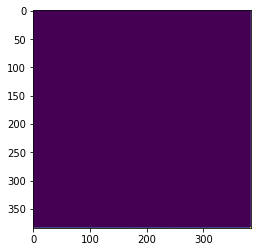

In [30]:
plt.imshow(np.resize(y_patches[4],(384,384)))

In [51]:
ax.shape

(2, 5)

In [7]:
a = X_pred[0].copy()

In [8]:
a.shape

(384, 384, 3)

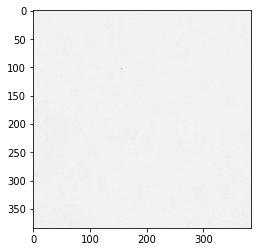

In [10]:
plt.imshow(a)

In [20]:
np.pad(a,1, 'edge')

array([[[0.94509807, 0.94509807, 0.9411765 , 0.94901964, 0.94901964],
        [0.94509807, 0.94509807, 0.9411765 , 0.94901964, 0.94901964],
        [0.94509805, 0.94509805, 0.94117648, 0.94901962, 0.94901962],
        ...,
        [0.94509805, 0.94509805, 0.94509805, 0.94509805, 0.94509805],
        [0.94509805, 0.94509805, 0.94509805, 0.94509805, 0.94509805],
        [0.94509805, 0.94509805, 0.94509805, 0.94509805, 0.94509805]],

       [[0.94509807, 0.94509807, 0.9411765 , 0.94901964, 0.94901964],
        [0.94509807, 0.94509807, 0.9411765 , 0.94901964, 0.94901964],
        [0.94509805, 0.94509805, 0.94117648, 0.94901962, 0.94901962],
        ...,
        [0.94509805, 0.94509805, 0.94509805, 0.94509805, 0.94509805],
        [0.94509805, 0.94509805, 0.94509805, 0.94509805, 0.94509805],
        [0.94509805, 0.94509805, 0.94509805, 0.94509805, 0.94509805]],

       [[0.94509805, 0.94509805, 0.94266239, 0.94753372, 0.94753372],
        [0.94509805, 0.94509805, 0.94266239, 0.94753372, 0.9

In [12]:
i = np.zeros(384)

In [17]:
b = np.insert(a,0,i)

In [18]:
b.shape

(442752,)

In [23]:
scaled_win_img.shape

(384, 384, 5)

In [33]:
mask.shape

(2292, 2292)

In [34]:
382*6

2292

In [41]:
patch.shape

(384, 384, 1)

In [43]:
rows

array([   0,  382,  764, 1146, 1528, 1910])

In [44]:
mask.shape

(2292, 2292)

In [50]:
patch.shape

(384, 384)

In [51]:
patch[pad:-pad,pad:-pad]

array([[0.00130245, 0.00133607, 0.00106114, ..., 0.00082299, 0.00123104,
        0.0013099 ],
       [0.000696  , 0.00081086, 0.00072017, ..., 0.00070569, 0.00091046,
        0.00084785],
       [0.00105935, 0.00120923, 0.0013541 , ..., 0.00084081, 0.00125828,
        0.00120586],
       ...,
       [0.00078326, 0.0008752 , 0.00100747, ..., 0.00083163, 0.00110501,
        0.00111154],
       [0.0010035 , 0.00104538, 0.00116599, ..., 0.00092241, 0.00111282,
        0.00141066],
       [0.00125372, 0.00094968, 0.00094277, ..., 0.00065884, 0.00100878,
        0.0013704 ]], dtype=float32)

In [54]:
pad

1

In [59]:
a = {'hello':[12,3]}



In [61]:
a.get('hello')

[12, 3]

In [145]:
mask.shape

(2292, 2292)

In [146]:
IMG_H

2886